In [2]:
'''
# ДОБАВЬТЕ В НАЧАЛО:
from tensorflow.keras import mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)
'''

In [10]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

In [ ]:
#!pip install tensorboard

In [3]:
#!pip install scikit-optimize -q

In [5]:
#!pip install optuna -q

In [6]:
#!pip install optuna-integration[tfkeras] -q

In [7]:
#!pip install optuna-dashboard -q

In [3]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

In [5]:
!nvidia-smi

Sun Oct 19 18:48:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0  On |                  N/A |
|  0%   42C    P8             12W /  200W |     851MiB /  12282MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [17]:
!curl -L -o ~/Downloads/animals10.zip\https://www.kaggle.com/api/v1/datasets/download/alessiocorrado99/animals10

curl: (2) no URL specified
curl: try 'curl --help' or 'curl --manual' for more information


In [11]:
# Текущая директория + путь к датасету

import os
HOME = os.getcwd()
print(HOME)
print('-----------------------')
# Пути
#IMAGE_PATH = "/home/oleg/projects/datasets/construction"
IMAGE_PATH = "/home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2/raw-img/"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
#dataset_path = "./construction"
#IMAGE_PATH = dataset_path
os.listdir(IMAGE_PATH)

/home/oleg/projects/ML/animals10
-----------------------


['gatto',
 'cane',
 'gallina',
 'scoiattolo',
 'elefante',
 'farfalla',
 'ragno',
 'pecora',
 'mucca',
 'cavallo']

In [19]:
!ls /home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2

home  raw-img  translate.py


In [14]:
import kagglehub
import os

# Установите переменную окружения ПЕРЕД импортом (если нужно перезапустить kernel)
os.environ['KAGGLE_HUB_CACHE'] = "/home/oleg/projects/datasets/kaggle_cache"

# Если уже импортировали kagglehub, перезапустите kernel или используйте:

# Скачиваем
path = kagglehub.dataset_download("alessiocorrado99/animals10")
print("Path to dataset files:", path)

import kagglehub

# Download latest version
path = kagglehub.dataset_download("alessiocorrado99/animals10")

print("Path to dataset files:", path)

Path to dataset files: /home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2


In [4]:
# как скачать датасет с Kaggle
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

import kagglehub

# Download latest version
path = kagglehub.dataset_download("alessiocorrado99/animals10")

print("Path to dataset files:", path)

/home/oleg/miniconda3/envs/tensflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|████████████████████████████████████████████████████████████████████████████████| 586M/586M [00:21<00:00, 29.0MB/s]

Extracting files...


Path to dataset files: /home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2


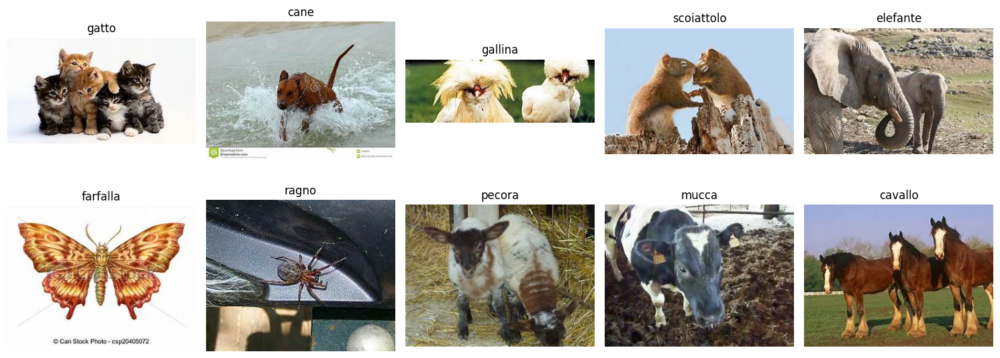

🎲 Показано по 1 случайному изображению из 10 категорий


In [12]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

📊 АНАЛИЗ ДАТАСЕТА:
  cane: 4863 файлов
  cavallo: 2623 файлов
  elefante: 1446 файлов
  farfalla: 2112 файлов
  gallina: 3098 файлов
  gatto: 1668 файлов
  mucca: 1866 файлов
  pecora: 1820 файлов
  ragno: 4821 файлов
  scoiattolo: 1862 файлов
📈 ИТОГО: 26179 изображений, 10 классов


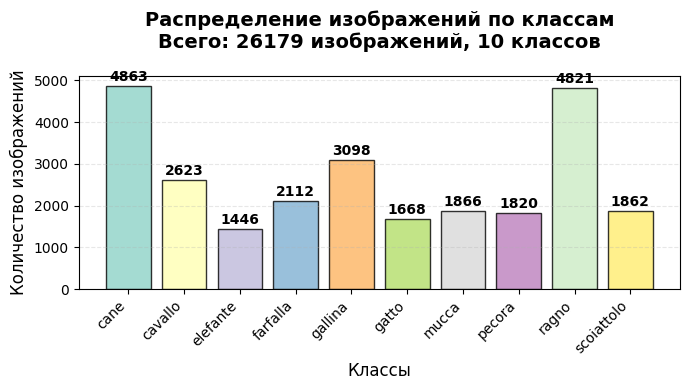

In [5]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [13]:
# МЕТКИ INTEGER

# САМЫЙ ПРОСТОЙ ВАРИАНТ - integer labels

import tensorflow as tf

#from tensorflow.keras.applications.resnet50 import preprocess_input        # импорт для resnet50
from tensorflow.keras.applications.efficientnet import preprocess_input     # импорт для efficientnet
#from tensorflow.keras.applications.efficientnet_v2 import preprocess_input

import numpy as np
import matplotlib.pyplot as plt

height, width = 224, 224
batch_size=32

print("🔄 СОЗДАЕМ ПАЙПЛАЙН...")

# Загрузка данных (хорошо!)
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

validation_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='validation', 
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

# Проверка формата (хорошо!)
images, labels = next(iter(train_data_raw))
print(f"Labels shape: {labels.shape}")  # (32,) - integer
print(f"Labels: {labels.numpy()[:15]}")  # [0, 1, 0, 2, 1]

class_names = train_data_raw.class_names
num_classes = len(class_names)
print(f"🏷️ Классы: {class_names}")

# Аугментация (хорошо!)
data_augmentation = tf.keras.Sequential([
    # ГЕОМЕТРИЧЕСКИЕ ТРАНСФОРМАЦИИ
    #layers.experimental.preprocessing.Resizing(224,224),
    tf.keras.layers.RandomFlip("horizontal"),
    #f.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2), # увеличить угол
    tf.keras.layers.RandomZoom(0.2), # увеличить зум
    #tf.keras.layers.RandomTranslation(0.2, 0.2),  # сдвиг по X и Y
    # ЦВЕТОВЫЕ ТРАНСФОРМАЦИИ  
    #tf.keras.layers.RandomContrast(0.2),
    #tf.keras.layers.RandomBrightness(0.2),
    
    # ШУМЫ И ИСКАЖЕНИЯ
    #tf.keras.layers.GaussianNoise(0.1),
    
    
    ])

#print("🔧 СОЗДАЕМ ПРОСТОЙ ПАЙПЛАЙН...")

'''
# Проепроцессин для RESNET
def preprocess_and_augment(image, label, training=False):
    """Preprocess + аугментация если training=True"""
    image = preprocess_input(tf.cast(image, tf.float32))
    if training:
        image = data_augmentation(image, training=True)
    return image, label
'''


# Проепроцессин для EfficientNet
def preprocess_and_augment(image, label, training=False):
    """Правильный препроцессинг для EfficientNet"""
    image = tf.cast(image, tf.float32)
    #image = preprocess_input(image)  # ✅ Должен нормализовать в [0, 1] или [-1, 1]
    if training:
        image = data_augmentation(image, training=True)
    return image, label

# Финальные datasets
train_data = (
    train_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=True),
         num_parallel_calls=tf.data.AUTOTUNE)
    .cache()  # ✅ ДОБАВИТЬ: кэширование ускорит обучение    
    .prefetch(tf.data.AUTOTUNE)
)

validation_data = (
    validation_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=False), 
         num_parallel_calls=tf.data.AUTOTUNE)
    .cache()  # ✅ ДОБАВИТЬ: кэширование ускорит обучение    
    .prefetch(tf.data.AUTOTUNE)
)

# Убедимся что препроцессинг работает правильно
print("🔍 Проверка препроцессинга:")
for images, labels in train_data.take(1):
    print(f"Shape: {images.shape}")
    print(f"Data range: {tf.reduce_min(images):.3f} to {tf.reduce_max(images):.3f}")
    print(f"Mean: {tf.reduce_mean(images):.3f}")
    break

print("✅ Пайплайн создан!")

🔄 СОЗДАЕМ ПАЙПЛАЙН...
Found 26179 files belonging to 10 classes.
Using 20944 files for training.
Found 26179 files belonging to 10 classes.
Using 5235 files for validation.
Labels shape: (32,)
Labels: [8 7 8 7 3 4 9 2 9 8 4 4 4 6 2]
🏷️ Классы: ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
🔍 Проверка препроцессинга:


2025-10-27 09:07:51.609095: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:07:51.788020: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


Shape: (32, 224, 224, 3)
Data range: 0.000 to 255.000
Mean: 130.323
✅ Пайплайн создан!


🎯 Расчет весов классов из тренировочных данных...


2025-10-27 09:08:00.044833: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.124216: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.234025: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.444331: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.482516: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.492126: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.626954: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.688126: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 09:08:00.729567: W tensorflow/core/lib/png/png_io.cc:92] PNG 

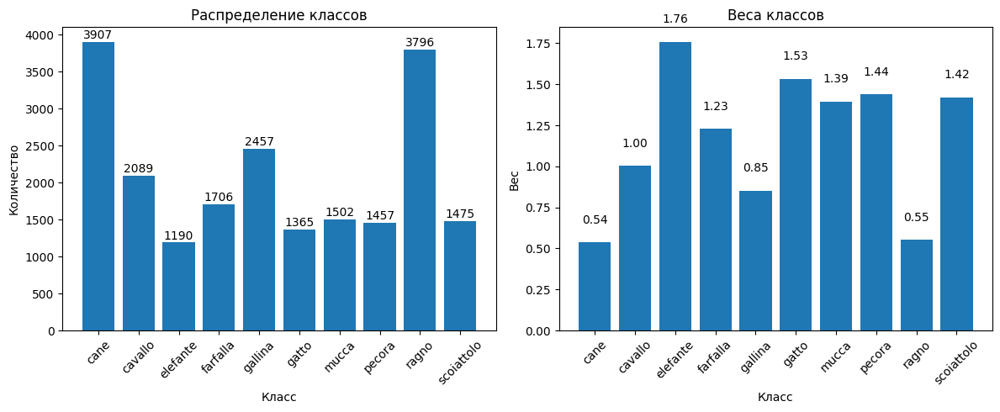

📊 РАСПРЕДЕЛЕНИЕ КЛАССОВ:
--------------------------------------------------
cane            | 3907 | вес: 0.54
cavallo         | 2089 | вес: 1.00
elefante        | 1190 | вес: 1.76
farfalla        | 1706 | вес: 1.23
gallina         | 2457 | вес: 0.85
gatto           | 1365 | вес: 1.53
mucca           | 1502 | вес: 1.39
pecora          | 1457 | вес: 1.44
ragno           | 3796 | вес: 0.55
scoiattolo      | 1475 | вес: 1.42


In [14]:
# Рассчитывает веса классов из tf.data.Dataset

def get_class_weights_from_dataset(dataset, class_names):
    """
    Рассчитывает веса классов из tf.data.Dataset
    """
    # Собираем все метки
    all_labels = []
    for images, labels in dataset:
        all_labels.extend(labels.numpy())
    
    y_train = np.array(all_labels)
    
    # Расчет весов
    from sklearn.utils.class_weight import compute_class_weight
    class_weights = compute_class_weight(
        'balanced',
        classes=np.unique(y_train),
        y=y_train
    )
    
    weights_dict = dict(enumerate(class_weights))
    
    # Визуализация
    plt.figure(figsize=(12, 5))
    
    # График 1: Распределение классов
    plt.subplot(1, 2, 1)
    unique, counts = np.unique(y_train, return_counts=True)
    bars = plt.bar(range(len(unique)), counts)
    plt.title('Распределение классов')
    plt.xlabel('Класс')
    plt.ylabel('Количество')
    plt.xticks(range(len(unique)), [class_names[i] for i in unique], rotation=45)
    
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10, 
                str(count), ha='center', va='bottom')
    
    # График 2: Веса классов
    plt.subplot(1, 2, 2)
    bars = plt.bar(weights_dict.keys(), weights_dict.values())
    plt.title('Веса классов')
    plt.xlabel('Класс')
    plt.ylabel('Вес')
    plt.xticks(range(len(unique)), [class_names[i] for i in unique], rotation=45)
    
    for bar, weight in zip(bars, weights_dict.values()):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
                f'{weight:.2f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Вывод информации
    print("📊 РАСПРЕДЕЛЕНИЕ КЛАССОВ:")
    print("-" * 50)
    for i, class_name in enumerate(class_names):
        count = counts[i] if i < len(counts) else 0
        weight = weights_dict.get(i, 0)
        print(f"{class_name:15} | {count:4} | вес: {weight:.2f}")
    
    return weights_dict

# ИСПОЛЬЗОВАНИЕ:
print("🎯 Расчет весов классов из тренировочных данных...")
class_weights = get_class_weights_from_dataset(train_data_raw, class_names)

🎲 АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA:


2025-10-27 08:53:52.190665: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-27 08:53:52.358351: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


Размер батча: (32, 224, 224, 3)
Количество изображений: 32


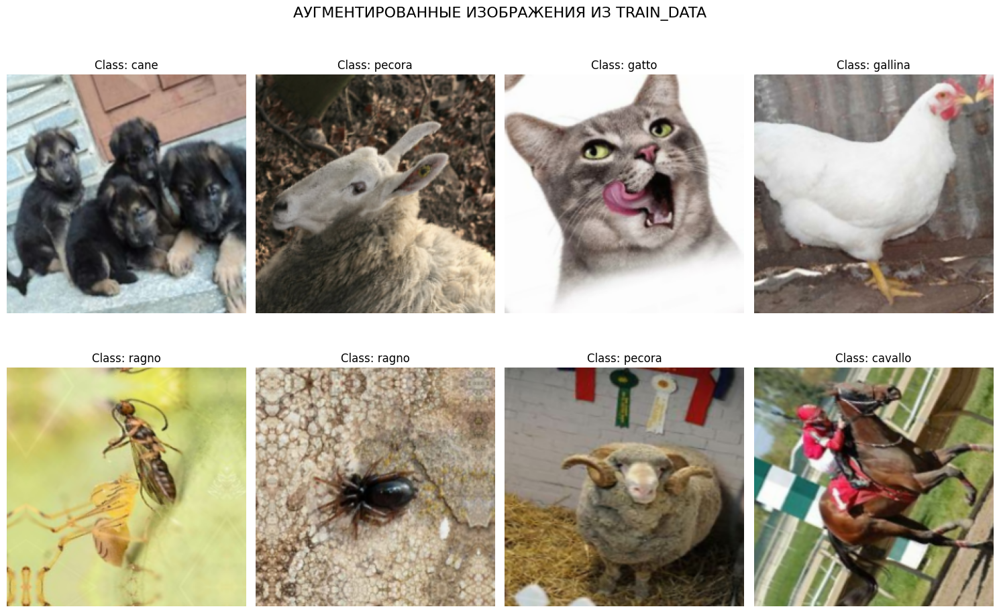

Диапазон данных в батче: 0.000 до 255.000


In [8]:
def show_augmented_batch():
    """Показывает аугментированные изображения из train_data"""
    # Берем один батч из train_data
    for images, labels in train_data.take(1):
        print(f"Размер батча: {images.shape}")  # (batch_size, height, width, channels)
        print(f"Количество изображений: {len(images)}")
        
        plt.figure(figsize=(15, 10))
        
        # Показываем первые 8 изображений из батча
        for i in range(min(8, len(images))):
            plt.subplot(2, 4, i+1)
            
            # Берем изображение из батча
            image = images[i]
            label = labels[i]
            
            # Денормализуем если нужно (из [0,1] в [0,255])
            if tf.reduce_max(image) <= 1.0:
                image = image * 255
            image = tf.cast(image, tf.uint8)
            
            plt.imshow(image)
            plt.title(f'Class: {class_names[label.numpy()]}')
            plt.axis('off')
        
        plt.suptitle('АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA', fontsize=16)
        plt.tight_layout()
        plt.show()
        
        # Проверяем диапазон данных
        print(f"Диапазон данных в батче: {tf.reduce_min(images):.3f} до {tf.reduce_max(images):.3f}")
        break

# Запускаем
print("🎲 АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA:")
show_augmented_batch()

🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):
📊 Распределение в тренировочных данных:


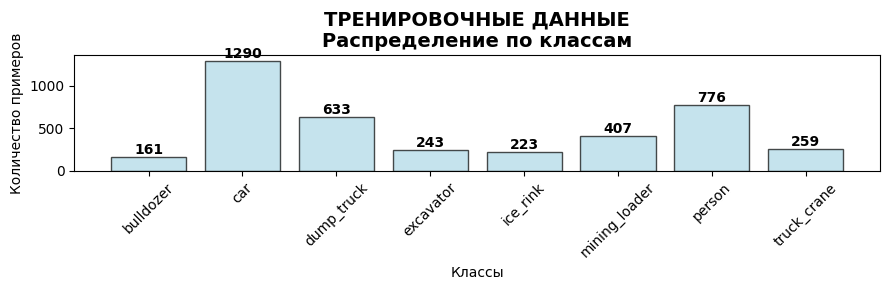

📊 Распределение в валидационных данных:


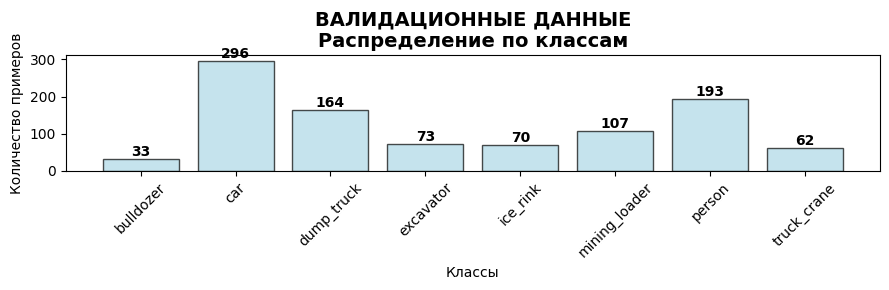


🖼️ По одному примеру на класс (тренировка):


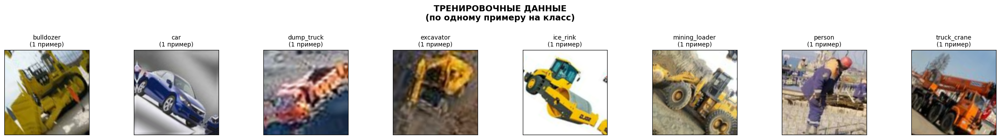


🖼️ По одному примеру на класс (валидация):


2025-10-19 18:49:32.898035: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


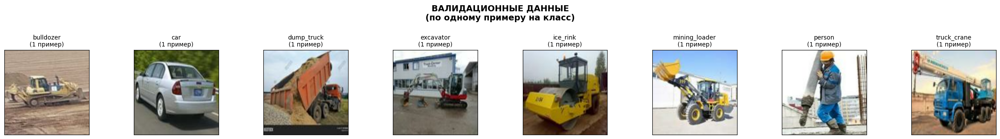

In [15]:
def visualize_single_example_per_class(dataset, class_names, title=""):
    """
    Визуализация по одному примеру для каждого класса
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset.take(10):  # Берем несколько батчей
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Создаем сетку для визуализации
    cols = len(class_names)
    fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3))
    
    if cols == 1:
        axes = [axes]
    
    fig.suptitle(f'{title}\n(по одному примеру на класс)', fontsize=14, fontweight='bold', y=1.05)
    
    for class_idx, class_name in enumerate(class_names):
        ax = axes[class_idx]
        
        # Находим первый пример этого класса
        class_mask = all_labels == class_idx
        class_examples = all_images[class_mask]
        
        if len(class_examples) > 0:
            # Берем первый пример класса
            image = class_examples[0].copy()
            
            # Восстанавливаем оригинальные цвета
            image[..., 0] += 103.939  # B
            image[..., 1] += 116.779  # G
            image[..., 2] += 123.68   # R
            image = np.clip(image, 0, 255).astype('uint8')
            image = image[..., ::-1]  # BGR → RGB
            
            ax.imshow(image)
            ax.set_title(f'{class_name}\n(1 пример)', fontsize=10)
        else:
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title(f'{class_name}\n(нет примеров)', fontsize=10)
            ax.text(0.5, 0.5, 'Нет примеров', 
                   ha='center', va='center', 
                   transform=ax.transAxes, fontsize=8)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)
    
    plt.tight_layout()
    plt.show()

# БЫСТРАЯ версия распределения
def visualize_class_distribution_simple(dataset, class_names, title=""):
    """
    Упрощенная визуализация распределения классов
    """
    # Считаем количество примеров по классам
    class_counts = {name: 0 for name in class_names}
    
    for images, labels in dataset:
        for label in labels.numpy():
            class_counts[class_names[label]] += 1
    
    # Визуализация
    plt.figure(figsize=(9, 3))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    bars = plt.bar(classes, counts, color='lightblue', edgecolor='black', alpha=0.7)
    plt.title(f'{title}\nРаспределение по классам', fontsize=14, fontweight='bold')
    plt.xlabel('Классы')
    plt.ylabel('Количество примеров')
    plt.xticks(rotation=45)
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return class_counts

# Тестируем упрощенную версию
print("🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):")
print("📊 Распределение в тренировочных данных:")
train_counts = visualize_class_distribution_simple(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("📊 Распределение в валидационных данных:")
val_counts = visualize_class_distribution_simple(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (тренировка):")
visualize_single_example_per_class(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (валидация):")
visualize_single_example_per_class(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

In [47]:
# v1 LivePlotCallback

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import IPython.display as display

class LivePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        self.fig = make_subplots(rows=1, cols=2, subplot_titles=('Loss', 'Accuracy'))
        self.loss_x, self.loss_y = [], []
        self.acc_x, self.acc_y = [], []
        self.val_loss_x, self.val_loss_y = [], []
        self.val_acc_x, self.val_acc_y = [], []
        
    def on_epoch_end(self, epoch, logs=None):
        # Обновляем данные
        self.loss_x.append(epoch)
        self.loss_y.append(logs['loss'])
        self.acc_x.append(epoch) 
        self.acc_y.append(logs['accuracy'])
        self.val_loss_x.append(epoch)
        self.val_loss_y.append(logs['val_loss'])
        self.val_acc_x.append(epoch)
        self.val_acc_y.append(logs['val_accuracy'])
        
        # Обновляем график
        self.fig.data = []
        self.fig.add_trace(go.Scatter(x=self.loss_x, y=self.loss_y, name='Train Loss'), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=self.val_loss_x, y=self.val_loss_y, name='Val Loss'), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=self.acc_x, y=self.acc_y, name='Train Acc'), row=1, col=2)
        self.fig.add_trace(go.Scatter(x=self.val_acc_x, y=self.val_acc_y, name='Val Acc'), row=1, col=2)
        
        # Показываем обновленный график
        display.clear_output(wait=True)
        self.fig.show()

# Теперь можно использовать
live_plot = LivePlotCallback()        

In [22]:
# v2

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import IPython.display as display

class LivePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.fig = make_subplots(
            rows=1, 
            cols=2, 
            subplot_titles=('Loss', 'Accuracy')
        )
        self.loss_x, self.loss_y = [], []
        self.acc_x, self.acc_y = [], []
        self.val_loss_x, self.val_loss_y = [], []
        self.val_acc_x, self.val_acc_y = [], []
        
    def on_epoch_end(self, epoch, logs=None):
        # Обновляем данные
        self.loss_x.append(epoch)
        self.loss_y.append(logs['loss'])
        self.acc_x.append(epoch) 
        self.acc_y.append(logs['accuracy'])
        self.val_loss_x.append(epoch)
        self.val_loss_y.append(logs['val_loss'])
        self.val_acc_x.append(epoch)
        self.val_acc_y.append(logs['val_accuracy'])
        
        # Очищаем и обновляем график
        self.fig.data = []
        
        # Loss график
        self.fig.add_trace(
            go.Scatter(x=self.loss_x, y=self.loss_y, name='Train Loss'), 
            row=1, col=1
        )
        self.fig.add_trace(
            go.Scatter(x=self.val_loss_x, y=self.val_loss_y, name='Val Loss'), 
            row=1, col=1
        )
        
        # Accuracy график
        self.fig.add_trace(
            go.Scatter(x=self.acc_x, y=self.acc_y, name='Train Acc'), 
            row=1, col=2
        )
        self.fig.add_trace(
            go.Scatter(x=self.val_acc_x, y=self.val_acc_y, name='Val Acc'), 
            row=1, col=2
        )
        
        # Обновляем layout
        self.fig.update_layout(
            title=f'Training Progress - Epoch {epoch}',
            width=1000,
            height=400
        )
        
        # Показываем обновленный график
        display.clear_output(wait=True) # Промежуточные эпохи скрываются благодаря display.clear_output(wait=True)
        self.fig.show()

# Теперь можно использовать
live_plot = LivePlotCallback()

In [38]:
# v3

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import IPython.display as display

class LivePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.fig = make_subplots(
            rows=1, 
            cols=2, 
            subplot_titles=('Model Accuracy', 'Model Loss'),
            horizontal_spacing=0.1
        )
        self.loss_x, self.loss_y = [], []
        self.acc_x, self.acc_y = [], []
        self.val_loss_x, self.val_loss_y = [], []
        self.val_acc_x, self.val_acc_y = [], []
        
    def on_epoch_end(self, epoch, logs=None):
        # Обновляем данные
        self.loss_x.append(epoch)
        self.loss_y.append(logs['loss'])
        self.acc_x.append(epoch) 
        self.acc_y.append(logs['accuracy'])
        self.val_loss_x.append(epoch)
        self.val_loss_y.append(logs['val_loss'])
        self.val_acc_x.append(epoch)
        self.val_acc_y.append(logs['val_accuracy'])
        
        # Очищаем и обновляем график
        self.fig.data = []
        
        # Accuracy график (слева)
        self.fig.add_trace(
            go.Scatter(
                x=self.acc_x, 
                y=self.acc_y, 
                name='Training Accuracy',
                line=dict(width=3, color='blue')
            ), 
            row=1, col=1
        )
        self.fig.add_trace(
            go.Scatter(
                x=self.val_acc_x, 
                y=self.val_acc_y, 
                name='Validation Accuracy',
                line=dict(width=3, color='red')
            ), 
            row=1, col=1
        )
        
        # Loss график (справа)
        self.fig.add_trace(
            go.Scatter(
                x=self.loss_x, 
                y=self.loss_y, 
                name='Training Loss',
                line=dict(width=3, color='blue')
            ), 
            row=1, col=2
        )
        self.fig.add_trace(
            go.Scatter(
                x=self.val_loss_x, 
                y=self.val_loss_y, 
                name='Validation Loss',
                line=dict(width=3, color='red')
            ), 
            row=1, col=2
        )
        
        # Обновляем layout в стиле matplotlib
        self.fig.update_layout(
            title=dict(
                text=f'Training Progress - Epoch {epoch}',
                x=0.5,
                font=dict(size=16)
            ),
            width=1200,
            height=500,
            showlegend=True,
            legend=dict(
                orientation="h",
                yanchor="bottom",
                y=1.02,
                xanchor="right",
                x=1
            )
        )
        
        # Обновляем оси в стиле matplotlib
        self.fig.update_xaxes(
            title_text="Epoch", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=1
        )
        self.fig.update_yaxes(
            title_text="Accuracy", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=1
        )
        
        self.fig.update_xaxes(
            title_text="Epoch", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=2
        )
        self.fig.update_yaxes(
            title_text="Loss", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=2
        )
        
        # Добавляем сетку как в matplotlib
        self.fig.update_layout(
            plot_bgcolor='white'
        )
        
        # Показываем обновленный график
        display.clear_output(wait=True)
        self.fig.show()

# Теперь можно использовать
live_plot = LivePlotCallback()

In [39]:
def create_head(x):
    # exp_4

    # 98.28
    
    x = GlobalAveragePooling2D()(x)
    
    # Первый слой с регуляризацией L2
    x = Dense(256, activation = 'relu', kernel_regularizer=l2(0.0001))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.7)(x)
    
    # Второй слой с регуляризацией L2
    x = Dense(128, activation = 'relu', kernel_regularizer=l2(0.0001))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    
    return x
    

In [56]:
def create_head(x):
    # exp_9
    
    # 3. КЛАССИФИКАТОР С ДВОЙНЫМ POOLING
    gap = GlobalAveragePooling2D()(x)
    gmp = GlobalMaxPooling2D()(x)
    x = Concatenate()([gap, gmp])
    x = BatchNormalization()(x)
    
    # Первый слой с регуляризацией L2
    x = Dense(512, activation = 'relu', kernel_regularizer=l2(0.0001))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.7)(x)
    
    # Второй слой с регуляризацией L2
    x = Dense(128, activation = 'relu', kernel_regularizer=l2(0.0001))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    
    return x

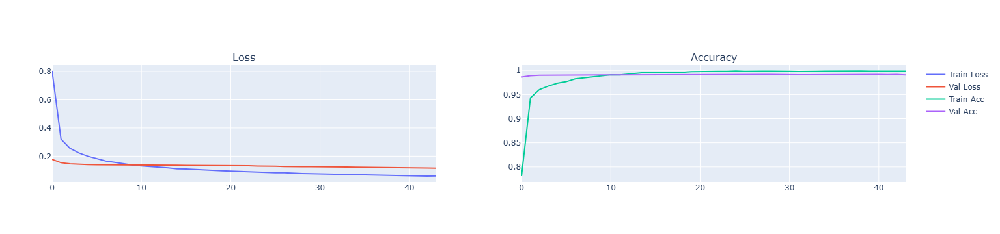

655/655 ━━━━━━━━━━━━━━━━━━━━ 68s 104ms/step - accuracy: 0.9983 - loss: 0.0600 - val_accuracy: 0.9906 - val_loss: 0.1155 - learning_rate: 1.0000e-04
Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 29.


2025/10/27 13:51:48 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.



📊 ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ...
164/164 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - accuracy: 0.9916 - loss: 0.1251
✅ Результаты обученной модели:
   - Validation Accuracy: 0.9916
   - Validation Loss: 0.1251
💾 Модель сохранена как 'best_animals10_0.9916.keras


0

In [71]:
# Обучаем финальную модель дольше
# Полный код для вашего случая

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import EfficientNetV2S, EfficientNetV2M, EfficientNetV2L
from tensorflow.keras.applications import EfficientNetV2B0, EfficientNetV2B1, EfficientNetV2B2, EfficientNetV2B3
from tensorflow.keras.applications import ConvNeXtTiny, ConvNeXtSmall, ConvNeXtBase, ConvNeXtLarge, ConvNeXtXLarge  

from tensorflow.keras import layers, Model
from tensorflow.keras.layers import (GlobalAveragePooling2D, GlobalMaxPooling2D, Dense, Dropout, BatchNormalization, Activation, Concatenate, Add)
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import datetime
import os
#from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.regularizers import l2




# Использование
live_plot = LivePlotCallback()

import gc
#tf.keras.backend.clear_session()
gc.collect()     # принудительно очищаем
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=0'
tf.get_logger().setLevel('ERROR')

# 🔧 СЛОВАРЬ MODELS:
MODELS = {
    # EfficientNetV2 Family (рекомендуется)
    'EfficientNetV2B0': EfficientNetV2B0,
    'EfficientNetV2B1': EfficientNetV2B1, 
    'EfficientNetV2B2': EfficientNetV2B2,
    'EfficientNetV2B3': EfficientNetV2B3,
    'EfficientNetV2S': EfficientNetV2S,
    'EfficientNetV2M': EfficientNetV2M, 
    'EfficientNetV2L': EfficientNetV2L,
   
    # ResNet Family  
    'ResNet50': ResNet50,
    # 'ResNeXt50': ResNeXt50,

    #   print("⚠️ ConvNeXt не установлен. Для установки: pip install convnext-tensorflow")
    # ConvNeXt Family
    'ConvNeXtTiny': ConvNeXtTiny,
    'ConvNeXtSmall': ConvNeXtSmall,
    'ConvNeXtBase': ConvNeXtBase, 
    'ConvNeXtLarge': ConvNeXtLarge,
    'ConvNeXtXLarge': ConvNeXtXLarge,
}


# =============================================================================
# 🔧 ПРЕДВАРИТЕЛЬНЫЕ НАСТРОЙКИ (ДОЛЖНЫ БЫТЬ ОПРЕДЕЛЕНЫ!)
# =============================================================================

# 🎯 ЗАДАЙТЕ ЭТИ ПЕРЕМЕННЫЕ ПЕРЕД ЗАПУСКОМ:

#model_name = 'EfficientNetV2S'  # Или 'EfficientNetV2S' и т.д.

#model_name = 'ConvNeXtTiny'  # Или 'EfficientNetV2S' и т.д.
#model_name = 'ConvNeXtSmall'  # Или 'EfficientNetV2S' и т.д.
model_name = 'ConvNeXtBase'  # Или 'EfficientNetV2S' и т.д.
#model_name = 'ConvNeXtLarge'  # Или 'EfficientNetV2S' и т.д.


height, width = 224, 224

# # ОЦЕНКА НЕ ОБУЧЕННОЙ МОДЕЛИ
# print(f"\n📊 ОЦЕНКА НЕ ОБУЧЕННОЙ  МОДЕЛИ...")
# val_results = model.evaluate(validation_data, verbose=1)
# val_loss, val_accuracy = val_results[0], val_results[1]
# print(f"✅ Результаты обученной модели:")
# print(f"   - Validation Accuracy: {val_accuracy:.4f}")
# print(f"   - Validation Loss: {val_loss:.4f}")

inputs = tf.keras.Input(shape=(height, width, 3))

base_model = MODELS[model_name](weights='imagenet', include_top=False, input_shape=(height, width, 3))
#base_model = MODELS[model_name](weights='imagenet', include_top=False, input_shape=(height, width, 3))
base_model.trainable = False

x = base_model(inputs, training=False)


#==========================ГОЛОВА===============================
# Создаём и добавляем головную часть
x = create_head(x)
#==========================ГОЛОВА===============================

# Завершённый слой классификации
outputs = Dense(num_classes, activation='softmax')(x)

learning_rate = 0.0001 

# Собираем и компилируем модель
model = tf.keras.Model(inputs, outputs)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

import mlflow
import mlflow.keras
mlflow.set_experiment("animals10_9")

#🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑🛑
#debug = input("Нажми Enter чтобы продолжить...") # 🛑 Остановка для отладки
#########################################################################################

with mlflow.start_run():
    # Автоматическое логирование
    mlflow.keras.autolog()
    final_history = model.fit(
        train_data,
        epochs=50,
        validation_data=validation_data,
        class_weight=class_weights,  # ← вот это если надо функция баланса классов class_weights
        callbacks=[
            tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True, verbose=1),
            tf.keras.callbacks.ModelCheckpoint(f'best_model_callback.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
            tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=7, factor=0.1, verbose=1),
            #tensorboard_callback,
            live_plot,
            #wandb.keras.WandbCallback(monitor="val_accuracy", mode="max", save_model=True, log_weights=True, log_gradients=True)
        ],
        verbose=1

        # Сохранение модели с новым параметром   
    )
    #best_val_acc = max(final_history.history['val_accuracy'])
    #mlflow.log_metric("best_val_accuracy", best_val_acc)
    
# mlflow.keras.log_model(
#     model,
#     "model",  # новый параметр вместо artifact_path
#     registered_model_name="animals10_model_8"
# )

# ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ...")
val_results = model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
# Сохраняем модель
model.save(f'best_animals10_{val_accuracy:.4f}.keras')
print(f"💾 Модель сохранена как 'best_animals10_{val_accuracy:.4f}.keras")

import gc
tf.keras.backend.clear_session()
gc.collect()     # принудительно очищаем

# 


In [ ]:
!tensorboard --logdir logs/fit

/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


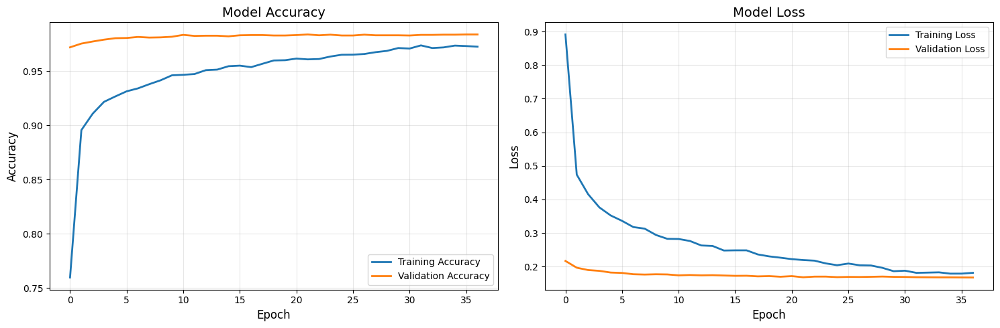

In [54]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

#history = final_history

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(final_history)

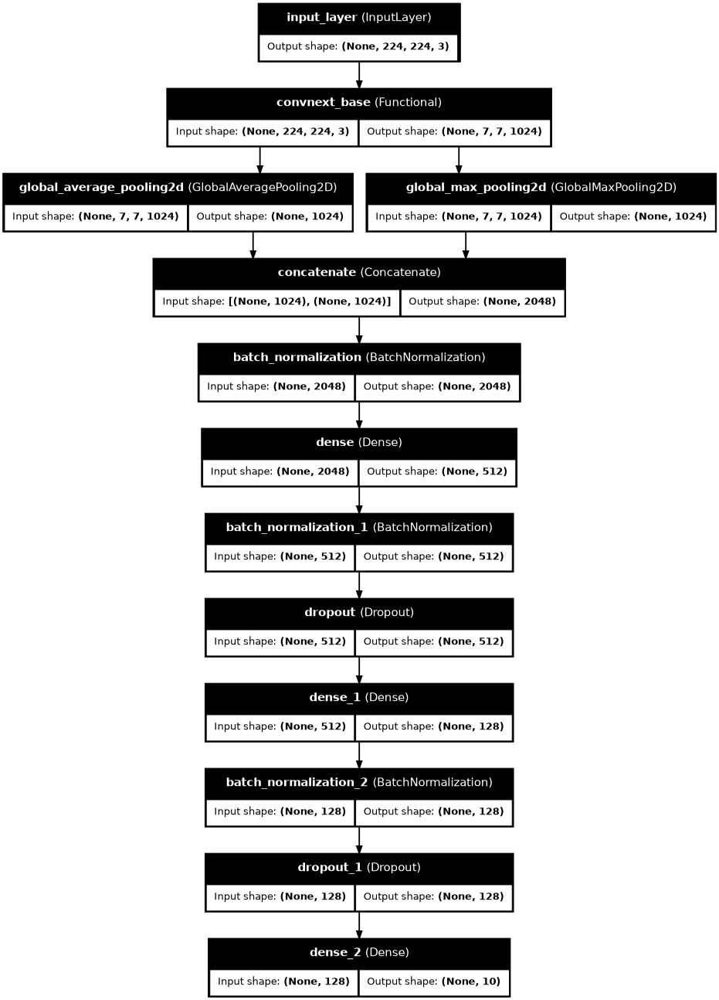

In [72]:
from tensorflow.keras.utils import plot_model
from PIL import Image

loaded_model = tf.keras.models.load_model('best_animals10_0.9916.keras')
#loaded_model.summary()


# # ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ
# print(f"\n📊 ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ...")
# val_results = loaded_model.evaluate(validation_data, verbose=1)
# val_loss, val_accuracy = val_results[0], val_results[1]
# print(f"✅ Результаты обученной модели:")
# print(f"   - Validation Accuracy: {val_accuracy:.4f}")
# print(f"   - Validation Loss: {val_loss:.4f}")

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
# Сохраняем модель
# loaded_model.save(f'trained_model_optuna_{val_accuracy:.4f}.keras')
# print("💾 Модель сохранена как 'trained_model_optuna_{val_accuracy:.4f}'")

plot_model(loaded_model, to_file=f'best_animals10__{val_accuracy:.4f}.png', show_shapes=True, show_layer_names=True, dpi=66)
#display(Image.open('model_temp.png'))
#plot_model(loaded_model, to_file=f'best_optuna_model_{val_accuracy:.4f}.png')


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

history = final_history

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(model, validation_data, class_names)

🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...
📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
📦 Обработано батчей: 40
📦 Обработано батчей: 50
📦 Обработано батчей: 60
📦 Обработано батчей: 70


🎲 ЗАПУСК УНИВЕРСАЛЬНОГО ТЕСТИРОВАНИЯ...
📥 Загружаем данные из dataset...
📊 Загружено 5235 изображений
📐 Формат изображений: (5235, 224, 224, 3)
🏷️ Формат меток: (5235,)
🎯 Делаем предсказания...
🔍 Обнаружен формат меток: SPARSE


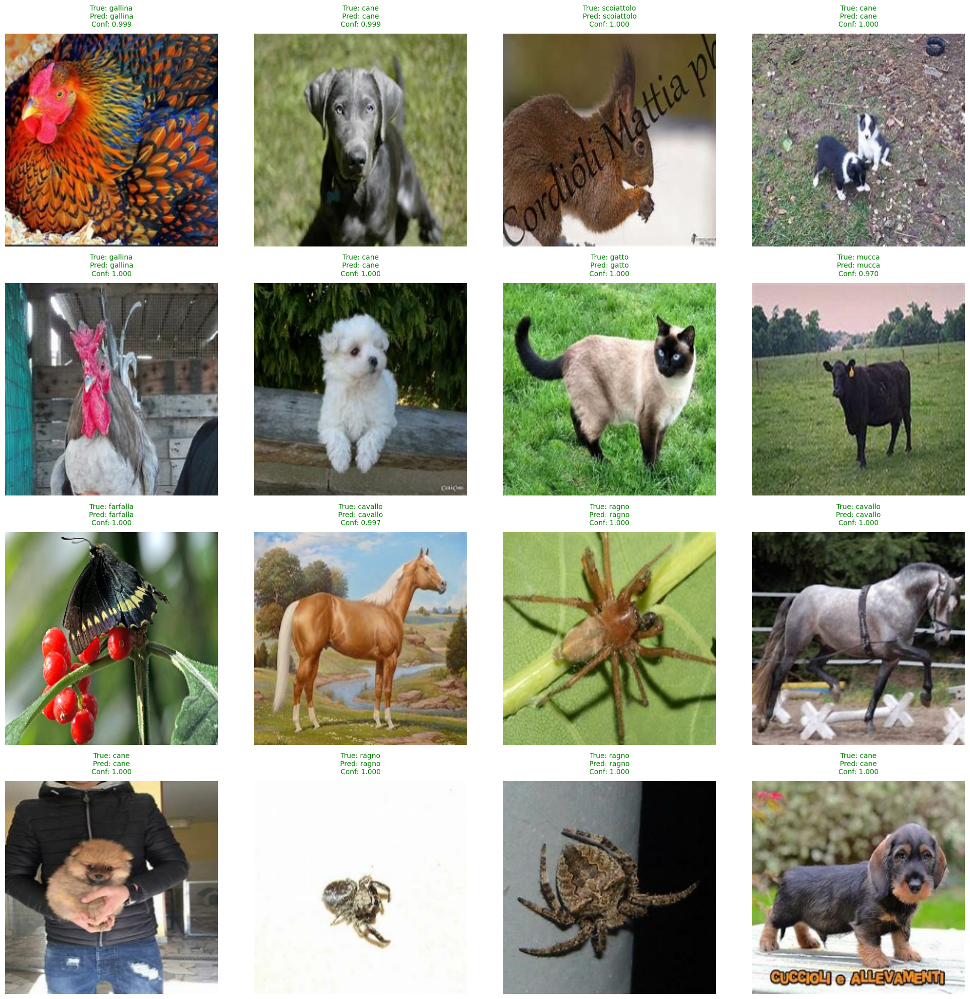


📊 РЕЗУЛЬТАТЫ ТЕСТИРОВАНИЯ:
   Правильных предсказаний: 16/16
   Точность: 100.0%
   Формат меток: SPARSE
   Диапазон изображений: [0.000, 255.000]
✅ Тестирование завершено!


In [60]:
# УНИВЕРСАЛЬНАЯ ВЕРСИЯ ДЛЯ ЛЮБОГО ФОРМАТА ДАННЫХ
def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная функция для тестирования модели на случайных примерах
    Работает с любым форматом меток (sparse, one-hot) и любым форматом изображений
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Собираем все данные из dataset
    print("📥 Загружаем данные из dataset...")
    all_images = []
    all_labels = []
    
    for batch_images, batch_labels in dataset:
        all_images.append(batch_images.numpy())
        all_labels.append(batch_labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    print(f"📊 Загружено {len(all_images)} изображений")
    print(f"📐 Формат изображений: {all_images.shape}")
    print(f"🏷️ Формат меток: {all_labels.shape}")
    
    # Выбираем случайные примеры
    total_samples = len(all_images)
    num_samples = min(num_samples, total_samples)
    indices = np.random.choice(total_samples, num_samples, replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Делаем предсказания
    print("🎯 Делаем предсказания...")
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # Определяем формат меток автоматически
    if len(selected_labels.shape) == 1:
        # SPARSE формат: [0, 1, 2, ...]
        true_classes = selected_labels
        label_format = "SPARSE"
    else:
        # ONE-HOT формат: [[1,0,0], [0,1,0], ...]
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем визуализацию
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    # Если только одна строка, преобразуем axes в 2D массив
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct_predictions = 0
    
    # Обрабатываем каждый пример
    for i in range(num_samples):
        row = i // cols
        col = i % cols
        ax = axes[row, col]
        
        # Получаем изображение
        image = selected_images[i].copy()
        
        # 🔥 УМНАЯ ДЕНОРМАЛИЗАЦИЯ ДЛЯ ЛЮБОГО ФОРМАТА
        if image.min() >= -1 and image.max() <= 1:
            # EfficientNet V2 предобработка: [-1, 1] -> [0, 255]
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            # Стандартная нормализация: [0, 1] -> [0, 255]
            image = image * 255
        elif image.min() >= 0 and image.max() <= 255:
            # Уже в правильном диапазоне
            pass
        else:
            # ImageNet нормализация: восстанавливаем оригинальные значения
            image = image * 255
        
        # Обеспечиваем правильный диапазон
        image = np.clip(image, 0, 255).astype(np.uint8)
        
        # 🔥 ПРАВИЛЬНОЕ ОТОБРАЖЕНИЕ ЦВЕТОВ
        # TensorFlow использует RGB, matplotlib использует RGB
        # НЕ нужно преобразовывать цвета!
        ax.imshow(image)
        
        # Получаем истинный и предсказанный классы
        true_class_idx = true_classes[i]
        pred_class_idx = predicted_classes[i]
        
        true_class_name = class_names[true_class_idx]
        pred_class_name = class_names[pred_class_idx]
        confidence = np.max(predictions[i])
        
        # 🔥 ПРАВИЛЬНОЕ ОПРЕДЕЛЕНИЕ ЦВЕТА
        is_correct = (true_class_idx == pred_class_idx)
        title_color = 'green' if is_correct else 'red'
        
        if is_correct:
            correct_predictions += 1
        
        # Создаем заголовок
        title = f"True: {true_class_name}\nPred: {pred_class_name}\nConf: {confidence:.3f}"
        ax.set_title(title, color=title_color, fontsize=10, pad=10)
        ax.axis('off')
    
    # Скрываем пустые subplots
    for i in range(num_samples, rows * cols):
        row = i // cols
        col = i % cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Выводим статистику
    accuracy = (correct_predictions / num_samples) * 100
    print(f"\n📊 РЕЗУЛЬТАТЫ ТЕСТИРОВАНИЯ:")
    print(f"   Правильных предсказаний: {correct_predictions}/{num_samples}")
    print(f"   Точность: {accuracy:.1f}%")
    print(f"   Формат меток: {label_format}")
    print(f"   Диапазон изображений: [{selected_images.min():.3f}, {selected_images.max():.3f}]")
    
    return correct_predictions, accuracy

# ТЕСТИРУЕМ УНИВЕРСАЛЬНУЮ ВЕРСИЮ
print("🎲 ЗАПУСК УНИВЕРСАЛЬНОГО ТЕСТИРОВАНИЯ...")
print("=" * 50)

correct, accuracy = test_random_predictions_universal(
    model=model,
    dataset=validation_data, 
    class_names=class_names,
    num_samples=16
)

print("=" * 50)
print(f"✅ Тестирование завершено!")

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [32]:
# Сохраняем в современном формате
model.save('best_model_scotp-2.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")

💾 Модель сохранена как 'best_model_1.keras'
